# Info
Name:  

    Check_4STAR_cloud_retr_ORACLES

Purpose:  

    To go through the steps to check the zenith cloud retrievals from 4STAR.
    To address issues with the parameter calculations that don't match modeled values at all. 

Input:

    None

Output:

    Figures

Keywords:

    none

Dependencies:

    - load_utils.py
    - matplotlib
    - numpy
    - Sp
  
Needed Files:
  - file.rc : for consistent creation of look of matplotlib figures
  - ...

Modification History:
    Written: Samuel LeBlanc, Santa Cruz, CA, 2020-01-22
    Modified: 


# Prepare python environment

In [4]:
import numpy as np
import Sp_parameters as Sp
import load_utils as lu
import write_utils as wu
from path_utils import getpath
import hdf5storage as hs
import scipy.io as sio
import matplotlib.pyplot as plt
%matplotlib notebook
import os


/usr/lib/python2.7/dist-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters


In [35]:
%matplotlib notebook

In [5]:
name = 'ORACLES'
vv = 'v1'
fp = getpath(name)


Return path named:  ORACLES /mnt/c/Users/lebla/Research/ORACLES/


The call for the retrieval results:

python ..\..\python_codes\Run_zen_cld_retrieval.py -lut ..\model\v5_10aod_ORACLES_lut.mat .\4STAR_20170818starzen.mat -o ..\zen_ict\v5_10aod\ -liq -plotlut -movie -taurange 1 60 -refrange 2 30


For 20160831 with SZA at 31.0
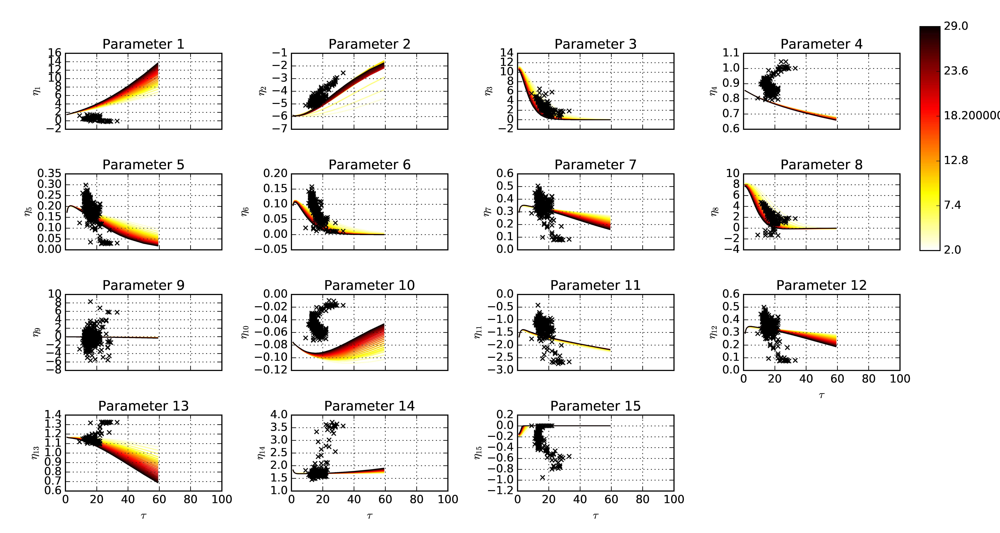
    
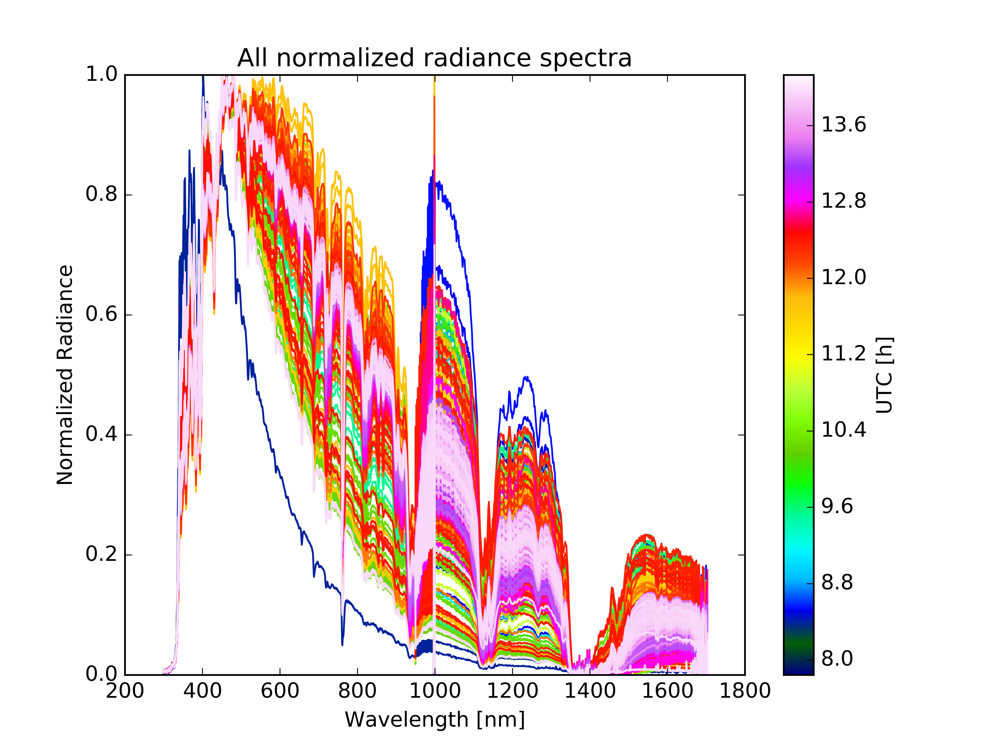

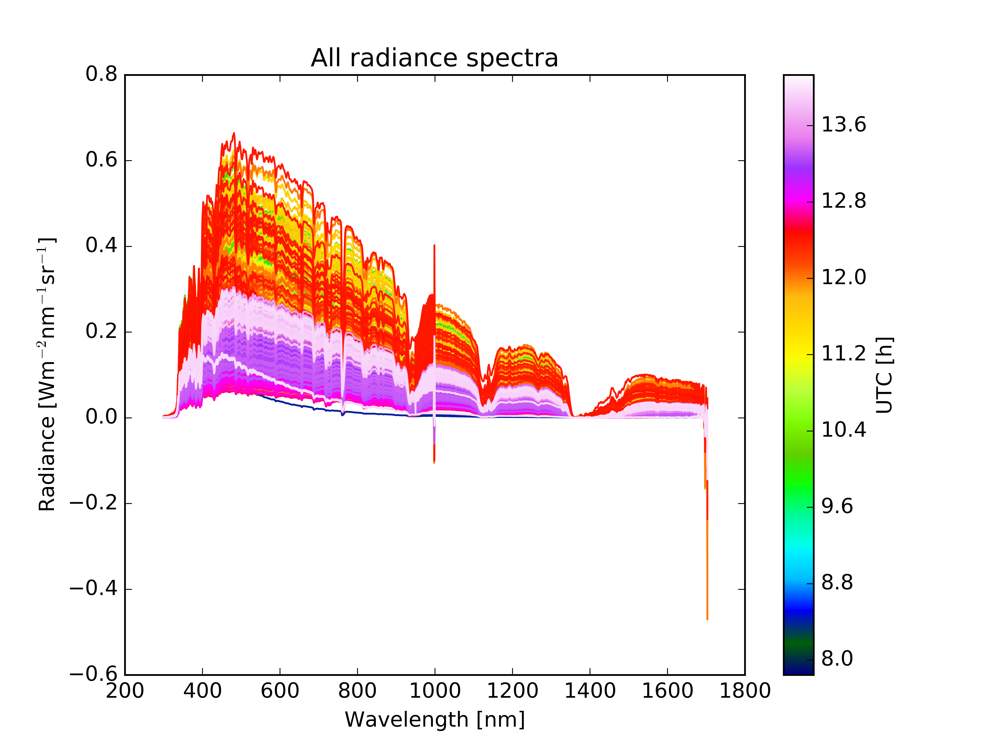


# Load files

## Load the starzen

In [10]:
fp_starzen = fp+'/starzen/4STAR_20160831starzen.mat'
mea = sio.loadmat(fp_starzen)

In [12]:
tt = lu.mat2py_time(mea['t'])
mea['utc'] = lu.toutc(tt)

In [13]:
print 'Running the parameter calculations on measured spectra'
meas = Sp.Sp(mea,verbose=False)
meas.params()

Running the parameter calculations on measured spectra


## Load the LUT

In [15]:
fp_lut_mat = fp+'model/v5_10aod_ORACLES_lut.mat'
luts = hs.loadmat(fp_lut_mat)

In [16]:
airmass = 1./np.cos(luts['sza']*np.pi/180.0)

# Start the retrieval pieces

In [23]:
start_tau = 1.0
end_tau = 60.0
start_ref = 2.0
end_ref = 30.0
forceliq = True
forceice = False
iz = 0

## Prep the LUT

In [17]:
meas.airmass = 1.0/np.cos(meas.sza*np.pi/180.0)
idx = Sp.find_closest(airmass,meas.airmass)

In [18]:
lut = []

In [24]:
for s in xrange(len(luts['sza'])):
    sptemp = {}
    sptemp['tau'] = luts['tau']
    sptemp['ref'] = luts['ref']
    sptemp['zout'] = luts['zout']
    sptemp['sza'] = luts['sza']
    sptemp['phase'] = luts['phase']
    sptemp['irr_dn_diff'] = luts['irr_dn_diff'][:,:,:,:,:,s]
    sptemp['irr_dn'] = luts['irr_dn'][:,:,:,:,:,s]
    sptemp['irr_up'] = luts['irr_up'][:,:,:,:,:,s]
    sptemp['wvl'] = [luts['wvl']]
    sptemp['rad'] = luts['rad'][:,:,:,:,:,s]
    ltemp = Sp.Sp(sptemp,verbose=False)
    if s in idx:
        ltemp.params(liq_only=forceliq,ice_only=forceice,iz=iz)
        ltemp.param_hires(start_ref=start_ref,end_ref=end_ref,start_tau=start_tau,end_tau=end_tau)
    lut.append(ltemp)

Running interpolation on params: [########################################]100% -- Done! 


Sp_parameters.py:593: UserWarning: Copyig the parameters calculated for liquid LUT to the ice LUT, ice parameters will be lost
  warnings.warn('Copyig the parameters calculated for liquid LUT to the ice LUT, ice parameters will be lost')


Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 
Running interpolation on params: [########################################]100% -- Done! 


## Now run through the retrieval

In [25]:
(meas.taut,meas.ref,meas.phase,meas.ki) = (np.zeros_like(meas.utc),np.zeros_like(meas.utc),np.zeros_like(meas.utc),np.zeros_like(meas.utc))

In [26]:
(meas.taut,meas.ref,meas.phase,meas.ki) = (meas.taut*np.nan,meas.ref*np.nan,meas.phase*np.nan,meas.ki*np.nan)

In [29]:
import run_kisq_retrieval as rk

In [30]:
print 'Running through the airmasses'
for i in np.unique(idx):
    try: 
        print 'airmass: {airmass}, {i}/{i_tot}'.format(airmass=airmass[i],i=i,i_tot=idx.max()-idx.min())
    except:
        if debug:
            import pdb; pdb.set_trace()
        else: 
            print 'Exception occurred at airmass: {} *** skipping'.format(airmass[i])
    meas.good = np.where(idx==i)[0]

    i500 = np.argmin(abs(meas.wvl-500))
    #i980,i995 = np.argmin(abs(meas.wvl-980)),np.argmin(abs(meas.wvl-995))
    #i999,i992 = np.argmin(abs(meas.wvl-999)),np.argmin(abs(meas.wvl-992))
    i981,i982 = 1039,1040
    #ss = np.nanstd(meas.norm[meas.good,i980:i995],axis=1)/np.nanmean(meas.norm[meas.good,i980:i995],axis=1)
    sss = abs(meas.norm[meas.good,i981]-meas.norm[meas.good,i982])
    #flt = (meas.norm[meas.good,i500]>0.4) & (ss<0.05)
    flt = sss<0.1 #(meas.norm[meas.good,i500]>0.4) & (sss<0.1)
    #import pdb; pdb.set_trace()
    meas.good = meas.good[flt]

    print 'meas.good lengh: {},meas.utc length: {}'.format(meas.good.shape,meas.utc.shape)
    tau,ref,phase,ki = rk.run_retrieval(meas,lut[i],force_liq=forceliq,force_ice=forceice)
    meas.taut[meas.good] = tau[meas.good]
    meas.ref[meas.good] = ref[meas.good]
    meas.phase[meas.good] = phase[meas.good]
    meas.ki[meas.good] = ki[meas.good]

Running through the airmasses
airmass: 1.01871669496, 0/5
meas.good lengh: (233,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.16663339722, 1/5
meas.good lengh: (422,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.32501299335, 2/5
meas.good lengh: (150,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.46627918564, 3/5
meas.good lengh: (237,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 
airmass: 1.78829164997, 5/5
meas.good lengh: (8,),meas.utc length: (1337,)
Retrieval progress over times: [########################################]100% -- Done! 


In [31]:
meas.tau = meas.taut

# Now plot out the intermediates and results

## Look at overall values

In [32]:
meas.keys()

['tau',
 'verbose',
 'sza',
 'stdparn',
 'phase',
 'airmass',
 'parn_liq',
 'alt',
 'par',
 'hiresirrad',
 'lon',
 'meansp',
 'datestr',
 'iwvls',
 'stdsp',
 'ref',
 'norm',
 'good',
 'iset',
 'parn',
 'stdpar',
 'parn_ice',
 'reflect',
 'isubwvl',
 'wvl',
 'lat',
 'npar',
 'sphires',
 'utc',
 'parhires',
 'sp',
 'irrad',
 'taut',
 'ki']

<IPython.core.display.Javascript object>


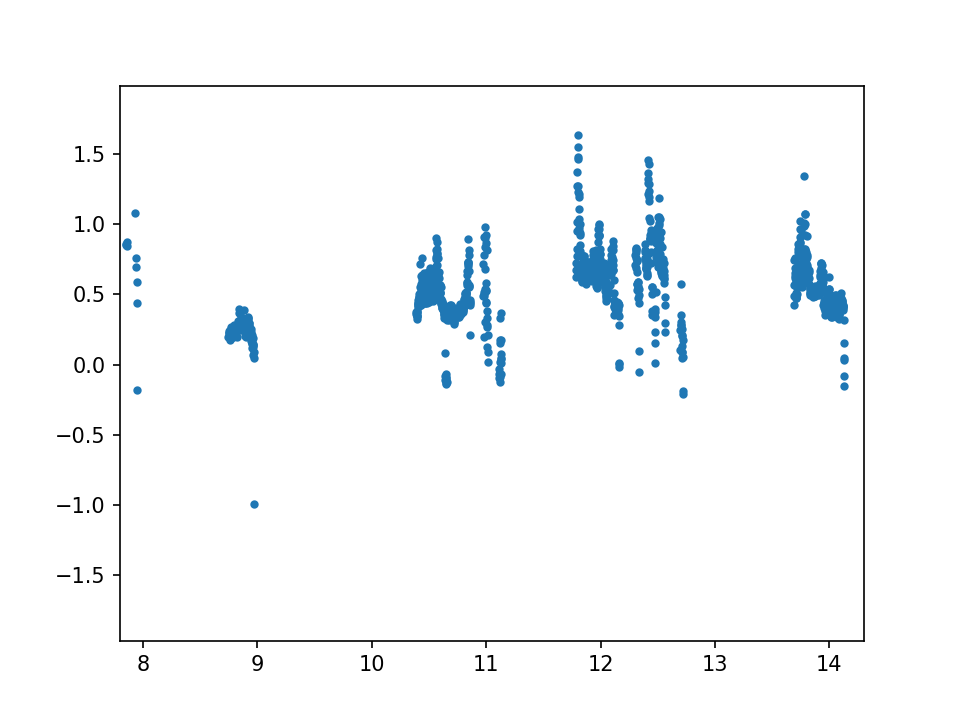

In [36]:
plt.figure()
plt.plot(meas['utc'],meas['par'][:,0],'.')

In [37]:
lut[0].keys()

['tau',
 'verbose',
 'sza',
 'stdparn',
 'help',
 'par',
 'iset',
 'ice',
 'meansp',
 'liq',
 'iwvls',
 'stdsp',
 'ref',
 'norm',
 'hiresirrad',
 'parn',
 'stdpar',
 'reflect',
 'isubwvl',
 'zout',
 'wvl',
 'npar',
 'sphires',
 'refsp',
 'refranges',
 'parhires',
 'sp',
 'irrad',
 'tausp']

In [38]:
lut[0]['par'].shape

(2, 28, 62, 16)

In [40]:
lut[0]['tau'].shape

(62,)

In [41]:
lut[0]['ref'].shape

(28,)

In [42]:
lut[0]['sza'].shape

(16,)

<IPython.core.display.Javascript object>


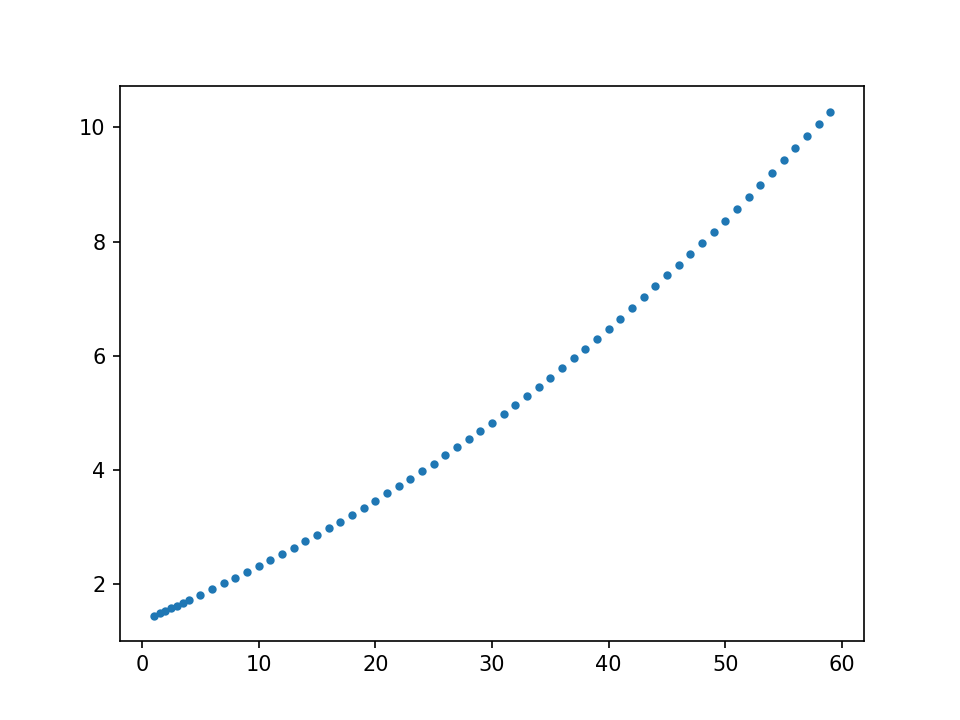

In [44]:
plt.figure()
plt.plot(lut[0]['tau'],lut[0]['par'][0,10,:,0],'.')

## Plot out the lut

In [57]:
from mpltools import color

In [60]:
sza = np.arccos(1.0/airmass)*180.0/np.pi

In [51]:
im = 1

<IPython.core.display.Javascript object>


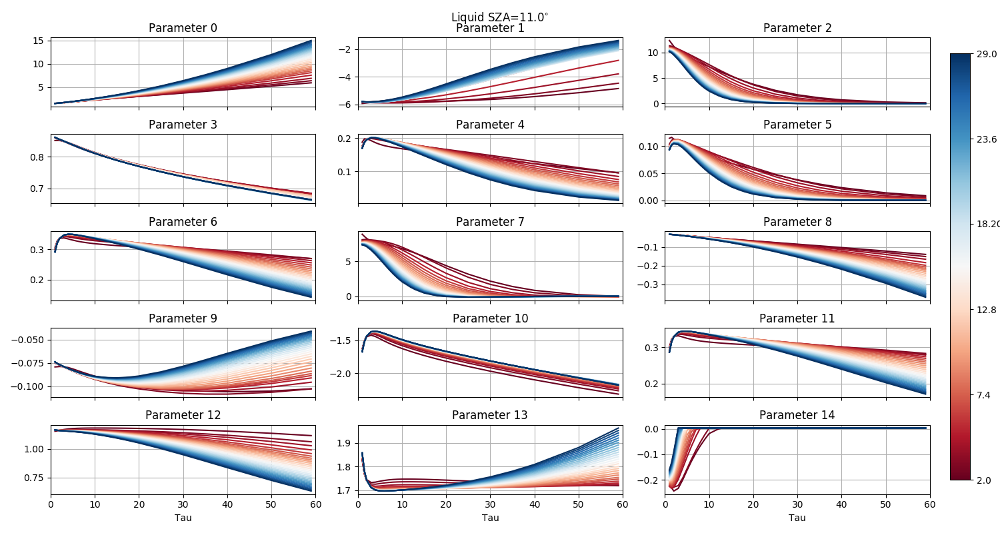

<IPython.core.display.Javascript object>


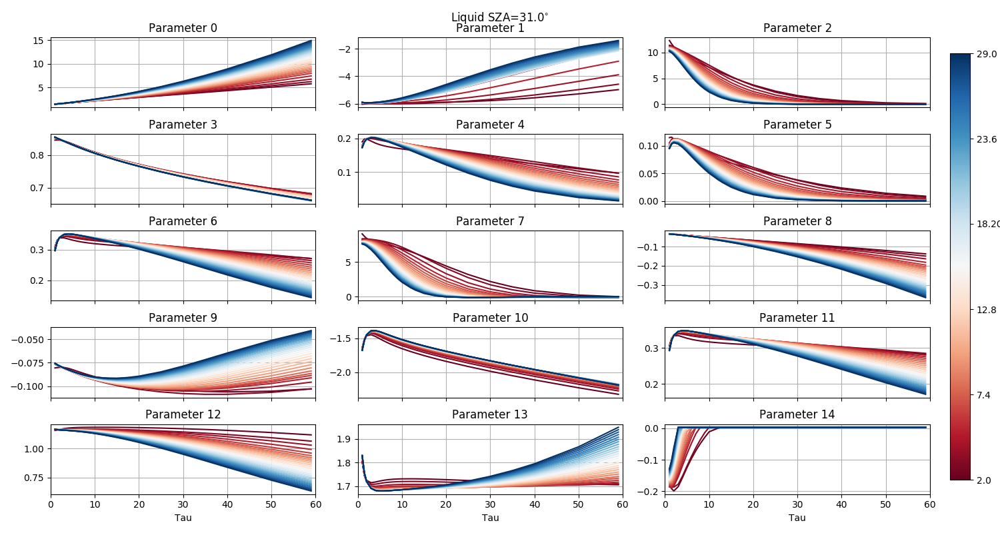

<IPython.core.display.Javascript object>


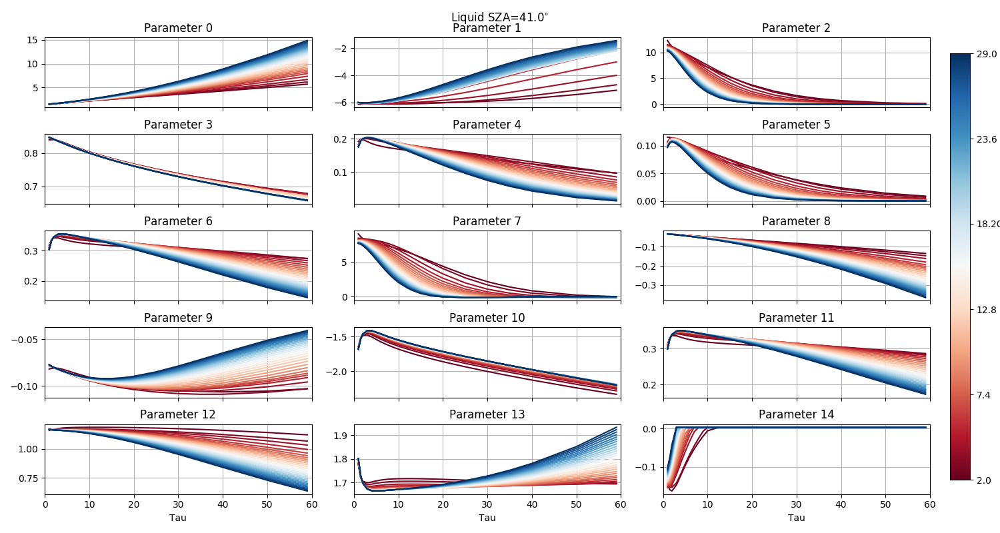

<IPython.core.display.Javascript object>


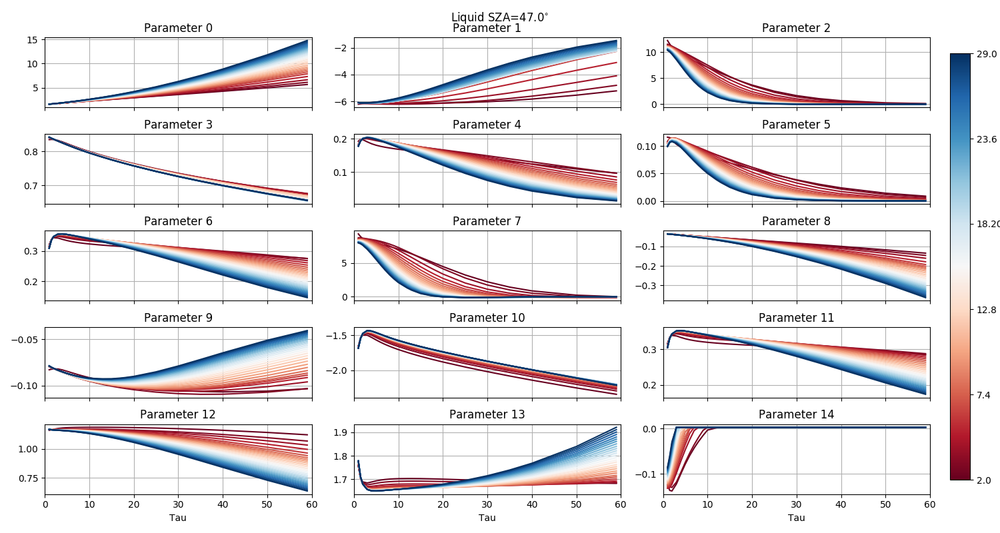

In [65]:
for im in range(4):
    fig3,ax3 = plt.subplots(5,3,sharex=True,figsize=(15,8))
    ax3 = ax3.ravel()

    for i in range(lut[im].npar-1):
        color.cycle_cmap(len(lut[im].ref[lut[im].ref<30]),cmap=plt.cm.RdBu,ax=ax3[i])
        for j in xrange(len(lut[im].ref)):
            ax3[i].plot(lut[im].tau,lut[im].par[0,j,:,i])
        ax3[i].set_title('Parameter '+str(i))
        ax3[i].grid()
        ax3[i].set_xlim([0,60])
        if i > 11: 
            ax3[i].set_xlabel('Tau')

    fig3.tight_layout()
    plt.suptitle('Liquid SZA={:2.1f}$^{{\circ}}$'.format(sza[im]))
    plt.subplots_adjust(top=0.93,right=0.93)

    cbar_ax = fig3.add_axes([0.95,0.10,0.02,0.8])
    scalarmap = plt.cm.ScalarMappable(cmap=plt.cm.RdBu,norm=plt.Normalize(vmin=0,vmax=1))
    scalarmap.set_array(lut[im].ref[lut[im].ref<30])
    cba = plt.colorbar(scalarmap,ticks=np.linspace(0,1,6),cax=cbar_ax)
    cba.ax.set_ylabel('R$_{ef}$ [$\\mu$m]')
    cba.ax.set_yticklabels(np.linspace(lut[im].ref[0],29,6));

#plt.show()

<IPython.core.display.Javascript object>


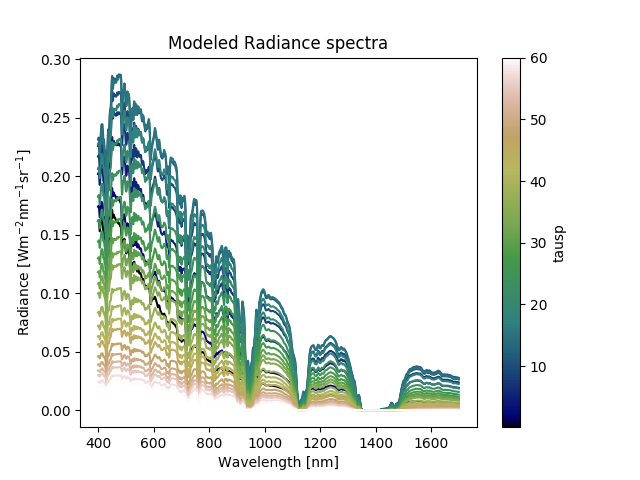

In [78]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=False,lims=[0,60],cmapname='gist_earth')

<IPython.core.display.Javascript object>


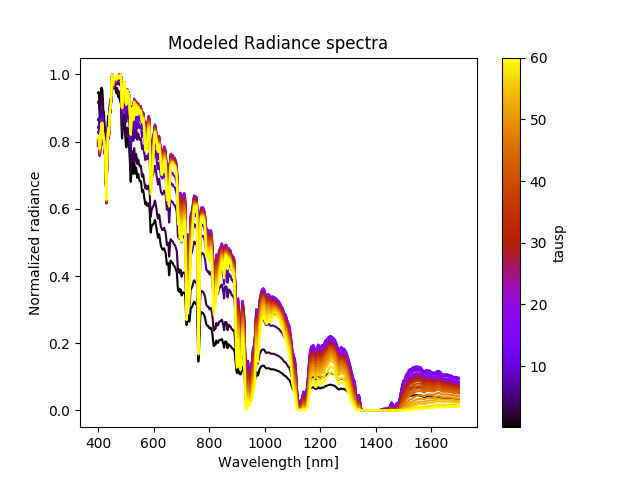

In [80]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=True,lims=[0,60],cmapname='gnuplot')

<IPython.core.display.Javascript object>


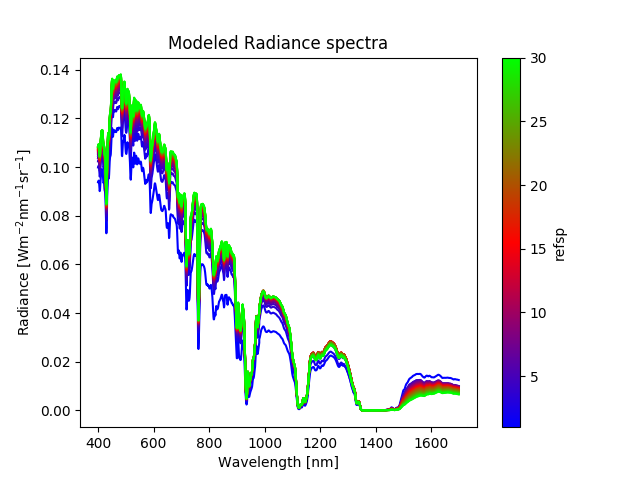

In [85]:
im = 1
pl = Sp.plt_lut_zenrad(lut[im],range_variable='refsp',norm=False,other_index=14,lims=[0,30],cmapname='brg')

## Plot out the measurements

<IPython.core.display.Javascript object>


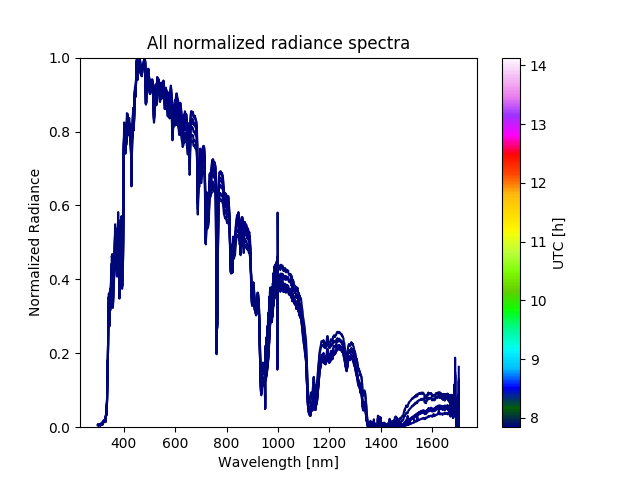

In [86]:
p = Sp.plt_norm_zenrad(meas)

<IPython.core.display.Javascript object>


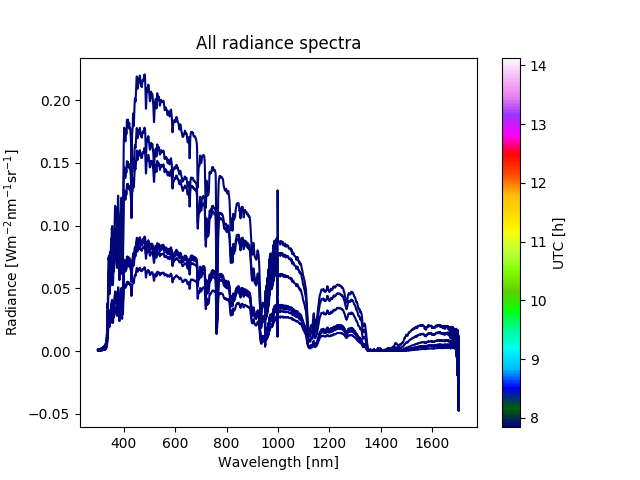

In [87]:
p = Sp.plt_zenrad(meas)

<IPython.core.display.Javascript object>


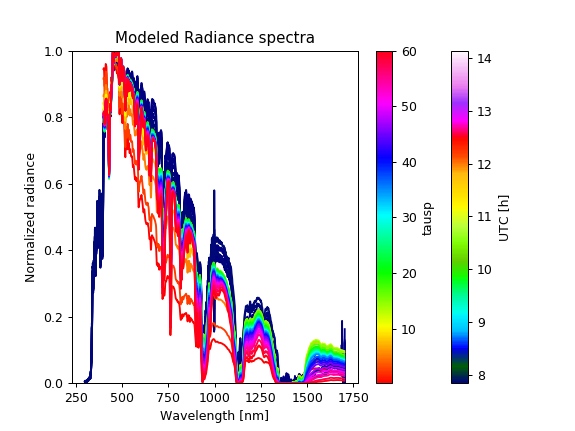

In [90]:
p = Sp.plt_norm_zenrad(meas)
pl = Sp.plt_lut_zenrad(lut[im],range_variable='tausp',norm=True,lims=[0,60],cmapname='hsv',fig=p)